# Hands-on Image Processing with Python

## Chapter 4: Image Enhancement
**Author: Sandipan Dey**

In this chapter, we will discuss some of the most basic tools in image processing, such as **mean/median filtering and histogram equalization**, which are still among the most powerful tools. The objective of image enhancement is to **improve the quality of an image or make particular features appear more prominent**. These techniques are more general purpose techniques, and a strong model of the degradation process is not assumed (unlike image restoration). Some examples of image enhancement techniques are **contrast stretching, smoothing, and sharpening**. We will describe the basic concepts and implementation of these techniques using Python library functions and using _***PIL, scikit-image, and scipy ndimage***_ libraries. We will become familiar with simple and still-popular approaches.

We will start with __point-wise intensity transformation__, and then discuss **contrast stretching, thresholding, half-toning, and dithering algorithms**, and the corresponding **Python library functions**. Then we will discuss different **histogram processing techniques** such as **histogram equalization** (both its global and adaptive version) and **histogram matching**. Then, a few techniques to **denoise** an image will be described. First, a few linear smoothing techniques such as the **average filter and Gaussian filter** will be described, followed by relatively more recent **non-linear noise smoothing techniques** such as median **filtering, bilateral filtering, and non-local means filtering**, along with how to implement them in Python. Finally, different image operations with **mathematical morphology** and their applications, along with implementations, will be described.

The topics to be covered in this chapter are as follows:
> 1. Point-wise intensity transformations – pixel transformation
2. Histogram processing, histogram equalization, histogram matching
3. Linear noise smoothing (mean filter)
4. Non-linear noise smoothing (median filter)

**Point-wise intensity transformations – pixel transformation**
<p>As discussed in the Chapter 1, Getting Started with Image Processing, the point-wise intensity transformation operation applies a transfer function, T, to each pixel, f(x,y), of the input image to generate a corresponding pixel in the output image. The transformation can be expressed as g(x,y) = T(f(x,y)) or, equivalently, s = T(r), where r is the gray-level of a pixel in the input image and s is the transformed gray-level of the same pixel in the output image. It's a memory-less operation, and the output intensity at the location,(x, y), depends only on the input intensity at the same point. Pixels of the same intensity get the same transformation. This does not bring in new information and may cause loss of information, but can improve the visual appearance or make features easier to detect—that is why these transformations are often applied at the pre-processing step in the image processing pipeline. The following screenshot shows the point processing, as well as the mask/kernel processing (for spatial filters that consider neighborhood pixels also for transformation, as we have already seen):</p>
<img src="../images/ch-4-1.png" width="400" height"200">
<p>Some popular intensity transformations are the following:</p>
   1. Image negatives
   2. Color space transformation
   3. Log transform
   4. Power-law transformation
   5. Contrast stretching
   6. Scalar quantization
   7. Thresholding
   
We already discussed a few of them in the Chapter 1, Getting Started with Image Processing. Here, we will start with log transformation on a colored RGB image using PIL, and then discuss a few transformations that we have not yet covered.


**Import libraries**
<p>As usual, we will start by importing all the required modules from the relevant Python libraries</p>

In [2]:
%matplotlib inline
import numpy as np
from skimage import data, img_as_float, img_as_ubyte, exposure, io, color
from skimage.io import imread
from skimage.exposure import cumulative_distribution
from skimage.restoration import denoise_bilateral, denoise_nl_means, estimate_sigma
from skimage.measure import compare_psnr
from skimage.util import random_noise
from skimage.color import rgb2gray
from PIL import Image, ImageEnhance, ImageFilter
from scipy import ndimage, misc
import matplotlib.pylab as pylab

### Log transform
The log transformation is very useful when we need to compress or stretch a certain range of gray-levels in an image; for example, in order to display the Fourier spectrum (where the DC component value is much higher than the others, so that without the log transform the other frequency components almost always cannot even be seen). The point transformation function for a log transform is of the general form,, where c is a constant.

Let's implement the histogram for the color channels of the input image:

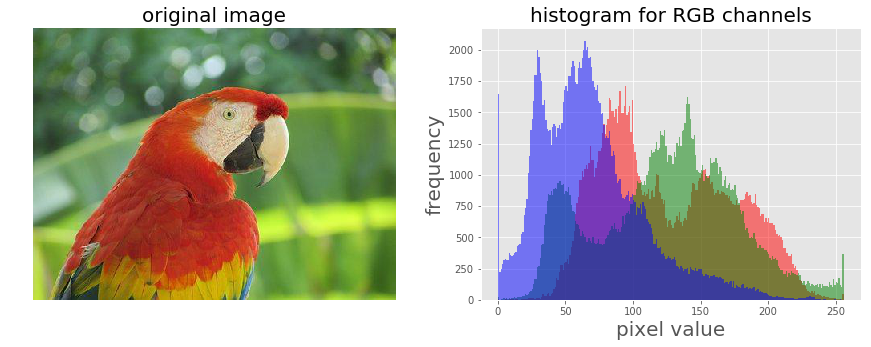

In [3]:
def plot_image(image, title=''):
    pylab.title(title, size=20), pylab.imshow(image)
    pylab.axis('off') # comment this line if you want axis ticks
    
def plot_hist(r, g, b, title=''):
    r, g, b = img_as_ubyte(r), img_as_ubyte(g), img_as_ubyte(b)
    pylab.hist(np.array(r).ravel(), bins=256, range=(0, 256), color='r', alpha=0.5)
    pylab.hist(np.array(g).ravel(), bins=256, range=(0, 256), color='g', alpha=0.5)
    pylab.hist(np.array(b).ravel(), bins=256, range=(0, 256), color='b', alpha=0.5)
    pylab.xlabel('pixel value', size=20), pylab.ylabel('frequency', size=20)
    pylab.title(title, size=20)
    
im = Image.open("../images/parrot.png")
im_r, im_g, im_b = im.split()
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121), plot_image(im, 'original image')
pylab.subplot(122), plot_hist(im_r, im_g, im_b,'histogram for RGB channels')
pylab.show()

The screenshot above shows the output—the histograms for the color channels for the original image before applying the log transformation

Let's now apply a log transform using the PIL image module's point()function and impact on the transformation on the histograms of different color channels for an RGB image:

The output shows how the histograms are squeezed for different color channels.

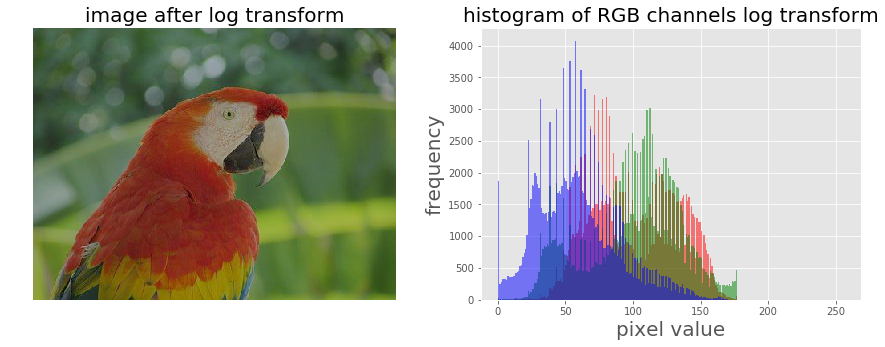

In [4]:
im = im.point(lambda i: 255*np.log(1+i/255))
im_r, im_g, im_b = im.split()
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121), plot_image(im, 'image after log transform')
pylab.subplot(122), plot_hist(im_r, im_g, im_b, 'histogram of RGB channels log transform')
pylab.show()

### Power-law transform

As we have already seen, this point transform (the transfer function is of the general form, _***s=T(r) = c.rγ [format error]***_, where c is a constant) on a grayscale image using the PIL point() function in the Chapter 1, Getting Started with Image Processing, let's apply power-law transform on a RGB color image with _***scikit-image***_ this time, and then visualize the impact of the transform on the color channel histograms:

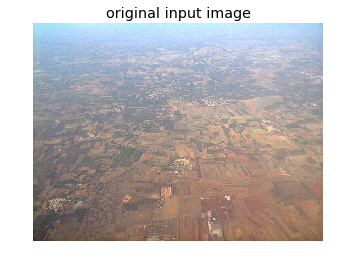

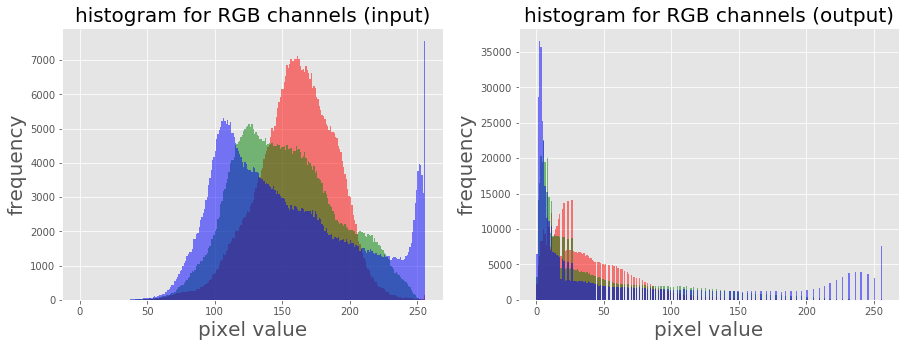

In [11]:
im = img_as_float(imread('../images/earthfromsky.jpg'))
# im = Image.open("../images/parrot.png")
pylab.title("original input image")
pylab.imshow(im)
pylab.axis("off")
pylab.show()
gamma = 5
im1 = im**gamma
# TypeError: unsupported operand type(s) for ** or pow(): 'PngImageFile' and 'int'
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121), plot_hist(im[...,0], im[...,1], im[...,2], 'histogram for RGB channels (input)')
pylab.subplot(122), plot_hist(im1[...,0], im1[...,1], im1[...,2], 'histogram for RGB channels (output)')
pylab.show()

### Contrast stretching with PIL as a point operation

The contrast stretching operation takes a low-contrast image as input and stretches the narrower range of the intensity values to span a desired wider range of values in order to output a high-contrast output image, thereby enhancing the image's contrast. It is just a linear scaling function that is applied to image pixel values, and hence the image enhancement is less drastic (than its more sophisticated counterpart histogram equalization, to be described shortly). The following screenshot shows the point transformation function for contrast stretching:

<img src="../images/ch-4-2.png" >

As can be seen from the previous screenshot, the upper and lower pixel value limits (over which the image is to be normalized), need to be specified before the stretching can be performed (for example, for a gray-level image, the limits are often set to 0 and 255, in order for the output image to span the entire range of available pixel values). All we need to find is a suitable value of m from the CDF of the original image. The contrast stretching transform produces higher contrast than the original by darkening the levels below the value m (in other words, stretching the values toward the lower limit) in the original image and brightening the levels previous to value m (stretching the values toward the upper limit) in the original image. The following sections describe how to implement contrast-stretching using the PIL library.

**Using PIL as a point operation**

Let us first load a colored RGB image and split it across the color channels to visualize the histograms of pixel values for different color channels:

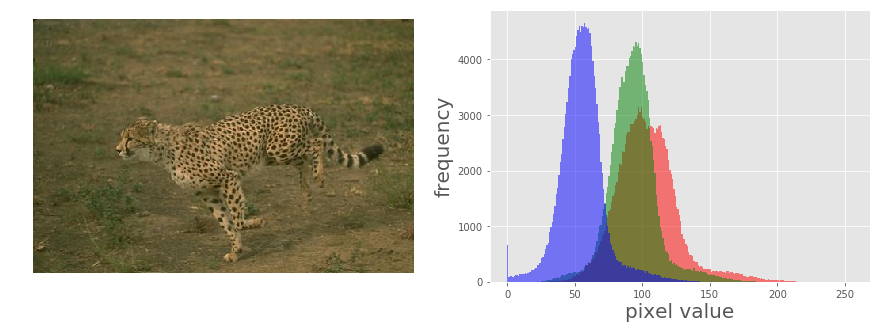

In [12]:
im = Image.open('../images/cheetah.png')
im_r, im_g, im_b, _ = im.split()
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121)
plot_image(im)
pylab.subplot(122)
plot_hist(im_r, im_g, im_b)
pylab.show()

The picture above shows the output of the previous code block. As can be seen, the input cheetah image is a low-contrast image since the color channel histograms are concentrated at a certain range of values (right-skewed), not spread over all possible pixel values

**Contrast stretching Using the PIL ImageEnhance module**

The contrast stretching operation stretches the over-concentrated gray-levels. The transfer function can be thought of as a piece-wise linear function, where the slope in the stretching region is greater than one. This can be seen from the following screenshot

<img src="../images/ch-4-3.png" width=250 height=250 >

The following code block shows how the PIL point()function can be used to implement contrast stretching. The transfer function is defined by the contrast() function as a piece wise linear function

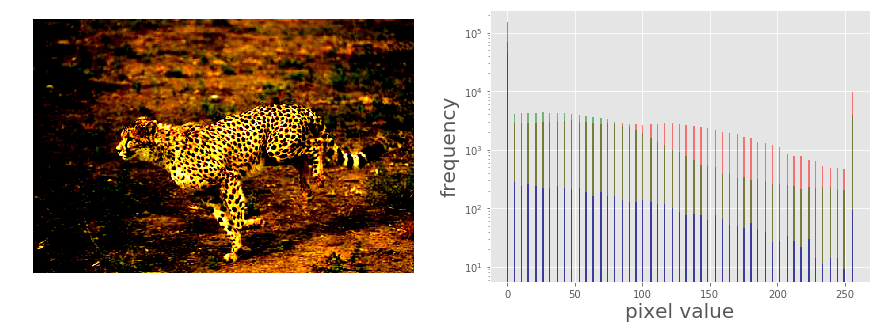

In [13]:
def contrast(c):
    return 0 if c < 70 else (255 if c > 150 else (255*c - 22950) / 48) # piece-wise linear function

im1 = im.point(contrast)
im_r, im_g, im_b, _ = im1.split()
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121)
plot_image(im1)
pylab.subplot(122)
plot_hist(im_r, im_g, im_b)
pylab.yscale('log',basey=10)
pylab.show()

The following picure above shows the output. As can be seen, the histogram of each channel has been stretched to the endpoints of the pixel values with the point operation

**Using the PIL ImageEnhance module**

The ImageEnhance module can also be used for contrast stretching. The following code block shows how to use the enhance() method from the contrast object to enhance the contrast of the same input image

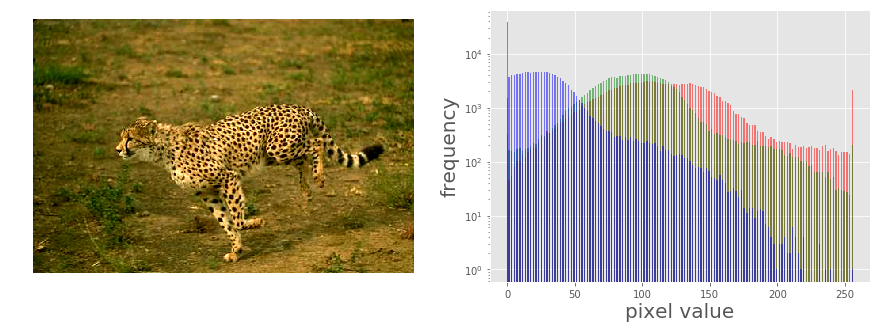

In [18]:
contrast = ImageEnhance.Contrast(im)
im1 = np.reshape(np.array(contrast.enhance(2).getdata()).astype(np.uint8), (im.height, im.width, 4)) 
pylab.style.use('ggplot')
pylab.figure(figsize=(15,5))
pylab.subplot(121), plot_image(im1)
pylab.subplot(122), plot_hist(im1[...,0], im1[...,1], im1[...,2]), pylab.yscale('log',basey=10)
pylab.show()

The picture above shows the output of the code. As can be seen, the contrast of the input image has been enhanced and the color channel histograms are stretched towards the endpoints

### Thresholding

This is a point operation that creates binary images from gray-level ones by turning all pixels below some threshold to zero and all pixels above that threshold to one, as shown in the following screenshot

<img src="../images/ch-4-4.png" >

If g(x, y) is a thresholded version of f(x, y) at some global threshold T, then the following can be applied

<img src="../images/eq-4-1.png" width=300 height=100>

Why do we need a binary image? A few reasons are, for example, that we may be interested in separating an image into foreground and background; that the image is to be printed with a black and white printer (and all the shades of gray need to be represented using black and white dots only); or that we want to pre-process the image with morphological operations, as we shall discuss later in this chapter.

#### Thresholding With a fixed threshold

The following code block shows how to to use the PIL point()function for thresholding with a fixed threshold:

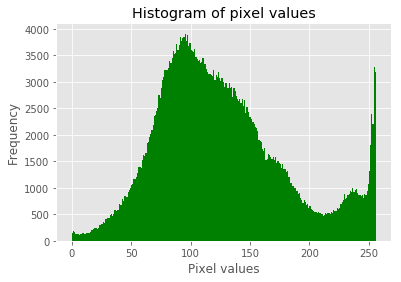

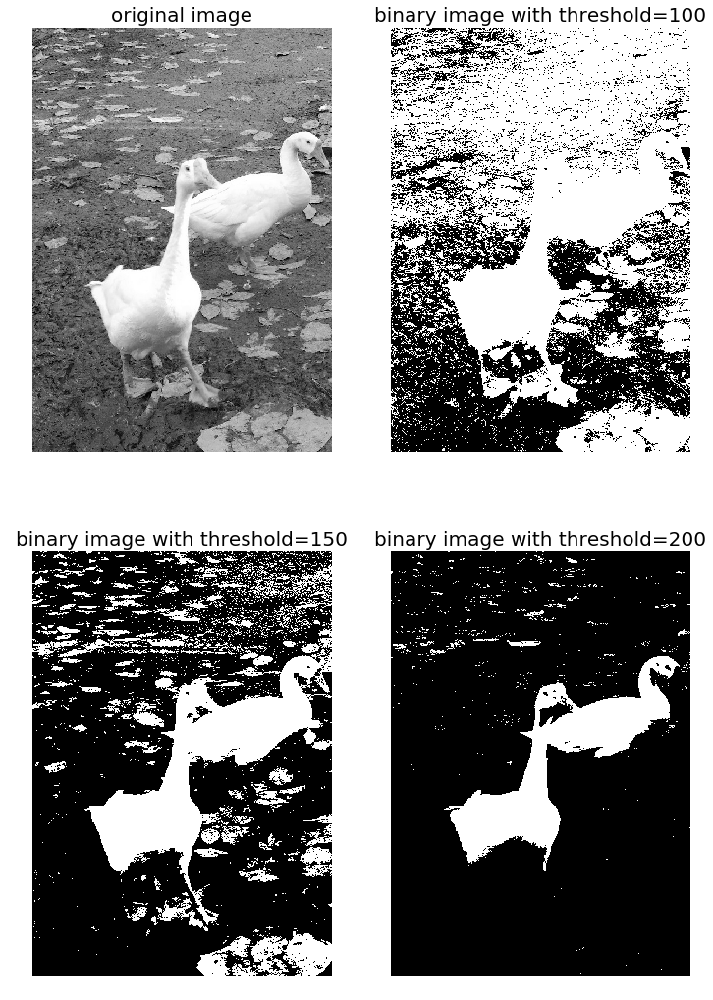

In [14]:
im = Image.open('../images/swans.jpg').convert('L')
pylab.hist(np.array(im).ravel(), bins=256, range=(0, 256), color='g')
pylab.xlabel('Pixel values'), pylab.ylabel('Frequency'),
pylab.title('Histogram of pixel values')
pylab.show()
pylab.figure(figsize=(12,18))
pylab.gray()
pylab.subplot(221), plot_image(im, 'original image'), pylab.axis('off')
th = [0, 50, 100, 150, 200]
for i in range(2, 5):
    im1 = im.point(lambda x: x > th[i])
    pylab.subplot(2,2,i), plot_image(im1, 'binary image with threshold=' + str(th[i]))
pylab.show()

The screenshots show the output of the previous code. First, we can see the distribution of the pixel values in the input image.

Also, as can be seen from the following, the binary images obtained with different gray-level thresholds are not shaded properly—resulting in an artefact known as false contours:

#### Half-toning

One way to reduce the false contour artefacts in thresholding (binary quantization) is **to add uniformly distributed white noise to the input image prior to quantization**. Specifically, to each input pixel of the grayscale image, f(x, y), we add an independent uniform [-128,128] random number, and then the thresholding is done. This technique is called half-toning. The following code block shows an implementation:

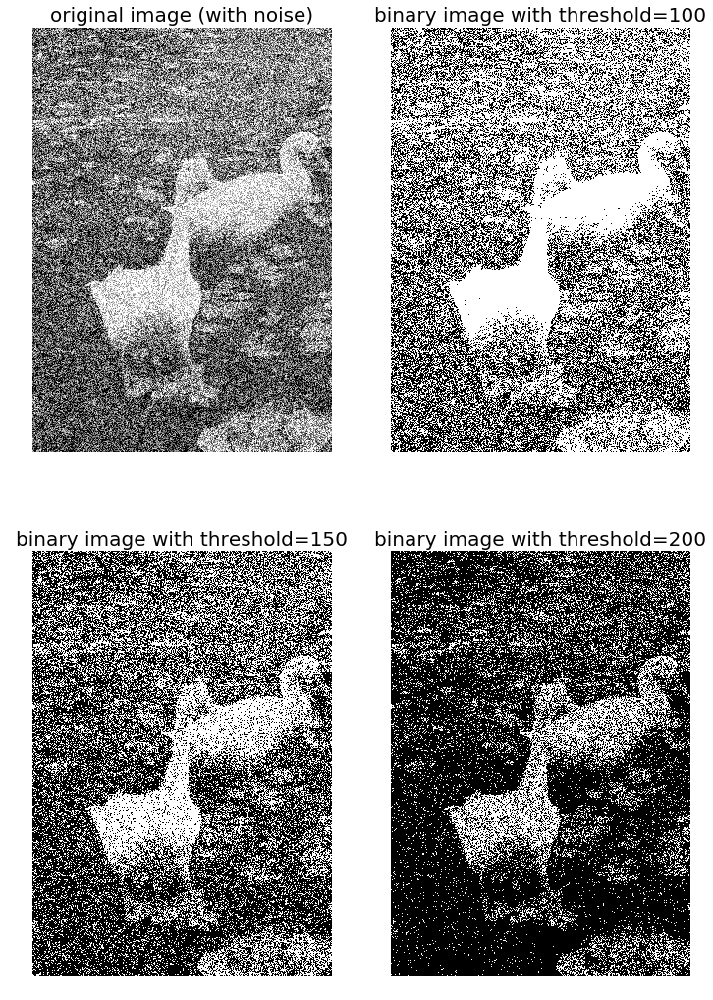

In [16]:
im = Image.open('../images/swans.jpg').convert('L')
im = Image.fromarray(np.clip(im + np.random.randint(-128, 128, (im.height, im.width)), 0, 255).astype(np.uint8))
pylab.figure(figsize=(12,18))
pylab.subplot(221), plot_image(im, 'original image (with noise)')
th = [0, 50, 100, 150, 200]
for i in range(2, 5):
    im1 = im.point(lambda x: x > th[i])
    pylab.subplot(2,2,i), plot_image(im1, 'binary image with threshold=' +   str(th[i]))
pylab.show()

Notice that even though the resulting binary images are somewhat noisy, the false contouring has been dramatically reduced, and with enough blurring (for example, when looking at them from a distance), they give us the impression of having several gray-levels

### Floyd-Steinberg dithering with error diffusion

Again, in order to prevent large-scale patterns (such as false contours), an intentionally applied form of noise is used to randomize the quantization error. This process is known as dithering. The Floyd-Steinberg algorithm implements dithering using the error diffusion technique—in other words, it pushes (adds) the residual quantization error of a pixel onto its neighboring pixels, to be dealt with later. It spreads the quantization error out according to the distribution shown in the following screenshot, as a map of the neighboring pixels

<img src="../images/ch-4-5.png" >

In the previous screenshot, the current pixel is represented with a star (*) and the blank pixels represent the previously-scanned pixels. The algorithm scans the image from left to right and top to bottom. It sequentially quantizes the pixel values one by one, each time the quantization error is distributed among the neighboring pixels (yet to be scanned), while not affecting the pixels that already got quantized. Hence, if a number of pixels have been rounded downward, it becomes more likely that the following pixel will be rounded upward by the algorithm so that the average quantization error is close to zero

### Histogram processing – histogram equalization and matching

Histogram processing techniques provide a better method for altering the dynamic range of pixel values in an image so that **its intensity histogram has a desired shape**. As we have seen, image enhancement by the contrast stretching operation is limited in the sense that it can apply only linear scaling functions.

Histogram processing techniques can be more powerful by employing non-linear (and non-monotonic) transfer functions to map the input pixel intensities to the output pixel intensities. In this section, we shall demonstrate the implementation of a couple of such techniques, namely histogram equalization and histogram matching, using the _**scikit-image**_ library's exposure module.

### Contrast stretching and histogram equalization with scikit-image

Histogram equalization uses a monotonic and a non-linear mapping which reassigns the pixel intensity values in the input image in such a way that the output image has a uniform distribution of intensities (a flat histogram), and thereby enhances the contrast of the image. The following screenshot describes the transformation function for histogram equalization:

<img src="../images/ch-4-6.png" width=300 height=150>

The following code block shows how to use the exposure module's equalize_hist() function to do histogram equalization with scikit-image. The histogram equalization implementation has two different flavors: one is a global operation over the entire image, while the second is local (adaptive) and done by dividing the image into blocks and running histogram equalization on each of them:


/usr/local/lib/python3.5/dist-packages/skimage/util/dtype.py:130: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


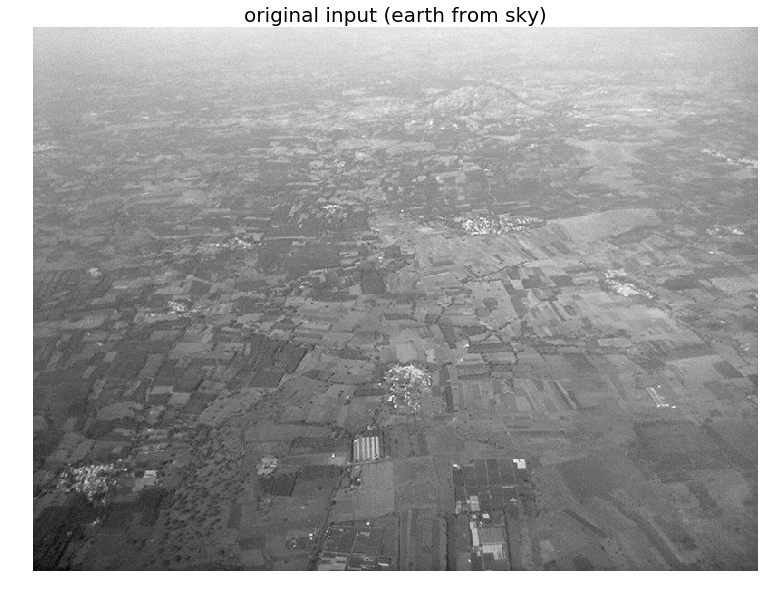

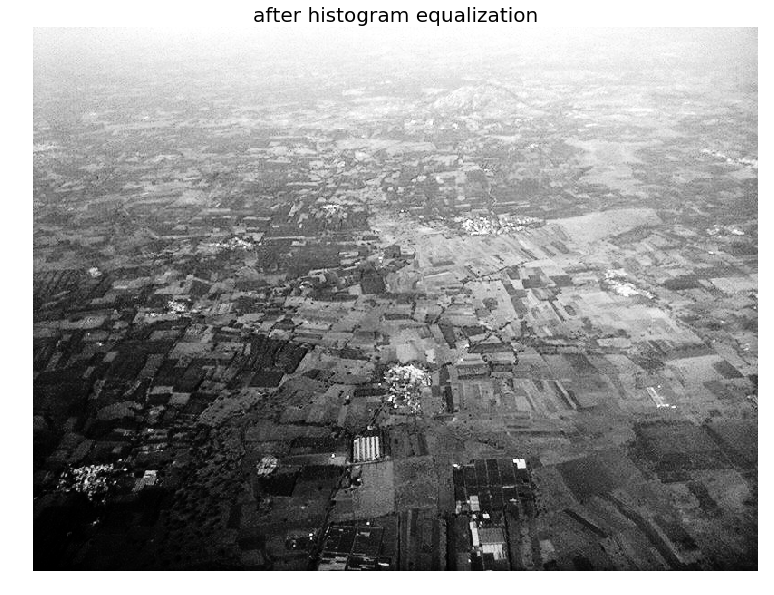

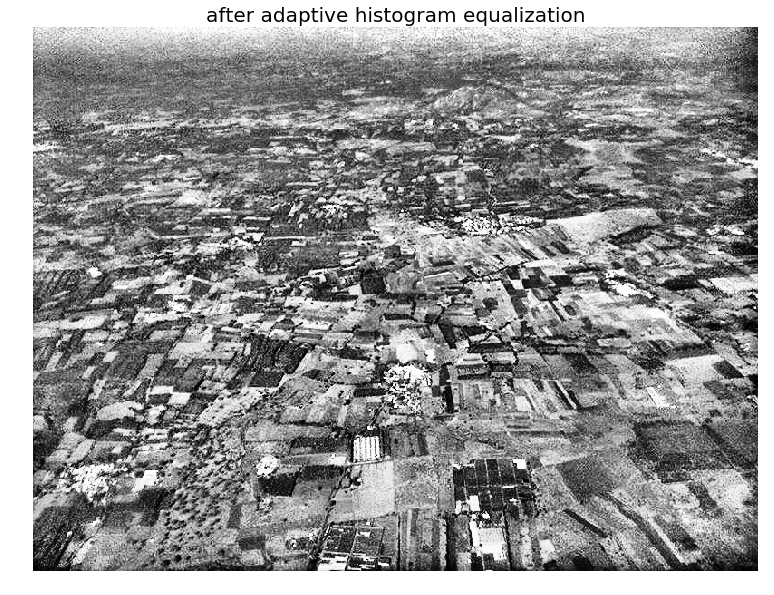

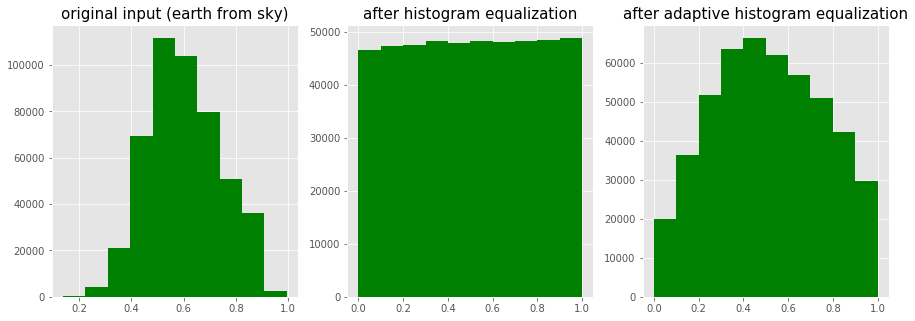

In [17]:
img = rgb2gray(imread('../images/earthfromsky.jpg'))
# histogram equalization
img_eq = exposure.equalize_hist(img)
# adaptive histogram equalization
img_adapteq = exposure.equalize_adapthist(img, clip_limit=0.03)
pylab.gray()
images = [img, img_eq, img_adapteq]
titles = ['original input (earth from sky)', 'after histogram equalization', 'after adaptive histogram equalization']
for i in range(3):
    pylab.figure(figsize=(20,10)), plot_image(images[i], titles[i])
pylab.figure(figsize=(15,5))
for i in range(3):
    pylab.subplot(1,3,i+1), pylab.hist(images[i].ravel(), color='g'), pylab.title(titles[i], size=15)
pylab.show()

The screenshots show the output of the previous code block. As can be seen, after histogram equalization, the output image histogram becomes almost uniform (the x axis represents pixel values and the y axis corresponding frequencies), although adaptive histogram equalization reveals the details of the image more clearly than the global histogram equalization.

The following code block compares the image enhancements obtained using two different histogram processing techniques, namely **contrast stretching** and **histogram equalization**, with _**scikit-image**_:

/usr/local/lib/python3.5/dist-packages/skimage/exposure/exposure.py:63: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  warn("This might be a color image. The histogram will be "


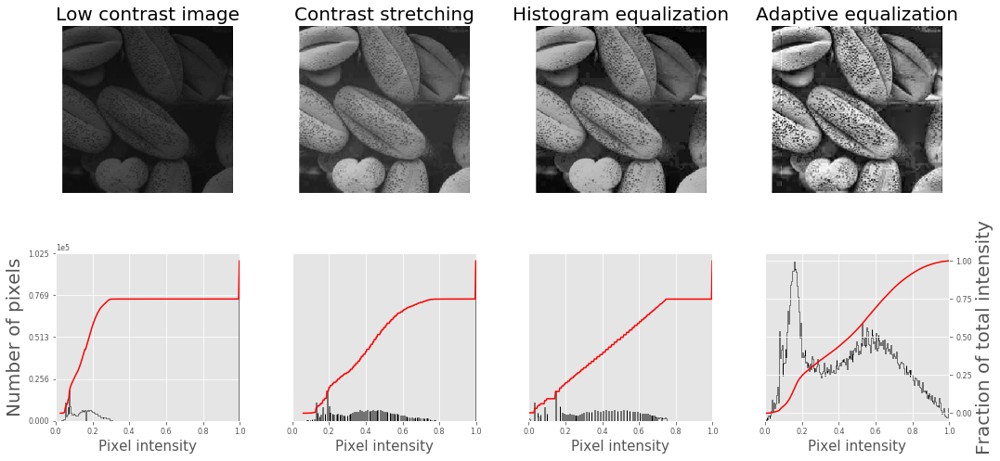

In [18]:
import matplotlib
matplotlib.rcParams['font.size'] = 8
def plot_image_and_hist(image, axes, bins=256):
    image = img_as_float(image)
    axes_image, axes_hist = axes
    axes_cdf = axes_hist.twinx()
    axes_image.imshow(image, cmap=pylab.cm.gray)
    axes_image.set_axis_off()
    axes_hist.hist(image.ravel(), bins=bins, histtype='step', color='black')
    axes_hist.set_xlim(0, 1)
    axes_hist.set_xlabel('Pixel intensity', size=15)
    axes_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    axes_hist.set_yticks([])
    image_cdf, bins = exposure.cumulative_distribution(image, bins)
    axes_cdf.plot(bins, image_cdf, 'r')
    axes_cdf.set_yticks([])
    return axes_image, axes_hist, axes_cdf

im = io.imread('../images/beans_g.png')
# contrast stretching
im_rescale = exposure.rescale_intensity(im, in_range=(0, 100), out_range=(0, 255))
im_eq = exposure.equalize_hist(im) # histogram equalization
im_adapteq = exposure.equalize_adapthist(im, clip_limit=0.03) # adaptive histogram equalization

fig = pylab.figure(figsize=(15, 7))
axes = np.zeros((2, 4), dtype = np.object)
axes[0, 0] = fig.add_subplot(2, 4, 1)
for i in range(1, 4):
    axes[0, i] = fig.add_subplot(2, 4, 1+i, sharex=axes[0,0], sharey=axes[0,0])
for i in range(0, 4):
    axes[1, i] = fig.add_subplot(2, 4, 5+i)
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im, axes[:, 0])
axes_image.set_title('Low contrast image', size=20)
y_min, y_max = axes_hist.get_ylim()
axes_hist.set_ylabel('Number of pixels', size=20)
axes_hist.set_yticks(np.linspace(0, y_max, 5))
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im_rescale, axes[:,1])
axes_image.set_title('Contrast stretching', size=20)
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im_eq, axes[:, 2])
axes_image.set_title('Histogram equalization', size=20)
axes_image, axes_hist, axes_cdf = plot_image_and_hist(im_adapteq, axes[:,3])
axes_image.set_title('Adaptive equalization', size=20)
axes_cdf.set_ylabel('Fraction of total intensity', size=20)
axes_cdf.set_yticks(np.linspace(0, 1, 5))
fig.tight_layout()
pylab.show()

The screenshot shows the output of the previous code. As can be seen, adaptive histogram equalization provides better results than histogram equalization in terms of making the details of the output image clearer.

### Histogram Matching

Histogram matching is a process where an image is altered in such a way that its histogram matches that of another reference (template) image's histogram. The algorithm is as follows:
1. The cumulative histogram is computed for each image, as shown in the following screenshot.
2. For any given pixel value, xi, in the input image (to be adjusted), we need to find the corresponding pixel value, xj, in the output image by matching the input image's histogram with the template image's histogram.
3. The xi pixel value has a cumulative histogram value given by G(xi). Find a pixel value, xj,so that the cumulative distribution value in the reference image, namely H(xj), is equal to G(xi).
4. The input data value xi is replaced by xj:

<img src="../images/ch-4-7.png" width=500 height=250>

The following code block shows how histogram matching can be implemented using Pytho

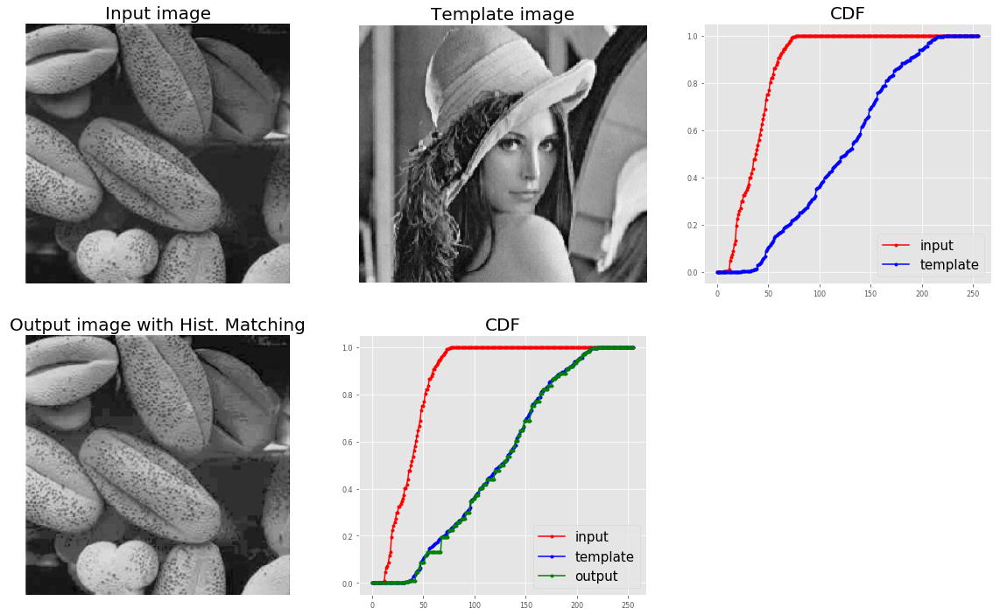

In [19]:
def cdf(im):
    '''
    computes the CDF of an image im as 2D numpy ndarray
    '''
    c, b = cumulative_distribution(im)
    # pad the beginning and ending pixels and their CDF values
    c = np.insert(c, 0, [0]*b[0])
    c = np.append(c, [1]*(255-b[-1]))
    return c

def hist_matching(c, c_t, im):
    '''
    c: CDF of input image computed with the function cdf()
    c_t: CDF of template image computed with the function cdf()
    im: input image as 2D numpy ndarray
    returns the modified pixel values for the input image
    '''
    pixels = np.arange(256)
    # find closest pixel-matches corresponding to the CDF of the input image, given the value of the CDF H of
    # the template image at the corresponding pixels, s.t. c_t = H(pixels) <=> pixels = H-1(c_t)
    new_pixels = np.interp(c, c_t, pixels)
    im = (np.reshape(new_pixels[im.ravel()], im.shape)).astype(np.uint8)
    return im

pylab.gray()
im = (rgb2gray(imread('../images/beans_g.png'))*255).astype(np.uint8)
im_t = (rgb2gray(imread('../images/lena_g.png'))*255).astype(np.uint8)
pylab.figure(figsize=(20,12))
pylab.subplot(2,3,1), plot_image(im, 'Input image')
pylab.subplot(2,3,2), plot_image(im_t, 'Template image')
c = cdf(im)
c_t = cdf(im_t)
pylab.subplot(2,3,3)
p = np.arange(256)
pylab.plot(p, c, 'r.-', label='input')
pylab.plot(p, c_t, 'b.-', label='template')
pylab.legend(prop={'size': 15})
pylab.title('CDF', size=20)
im = hist_matching(c, c_t, im)
pylab.subplot(2,3,4), plot_image(im, 'Output image with Hist. Matching')
c1 = cdf(im)
pylab.subplot(2,3,5)
pylab.plot(np.arange(256), c, 'r.-', label='input')
pylab.plot(np.arange(256), c_t, 'b.-', label='template')
pylab.plot(np.arange(256), c1, 'g.-', label='output')
pylab.legend(prop={'size': 15})
pylab.title('CDF', size=20)
pylab.show()

The following picture above shows the output of the previous code. As can be seen, the output bean image's CDF coincides with the input Lena image's CDF after histogram matching, and this enhances the contrast of the low-contrast input bean image

### Histogram matching for an RGB image

For each of the color channels, the matching can be done independently to obtain output as in the following


255 255


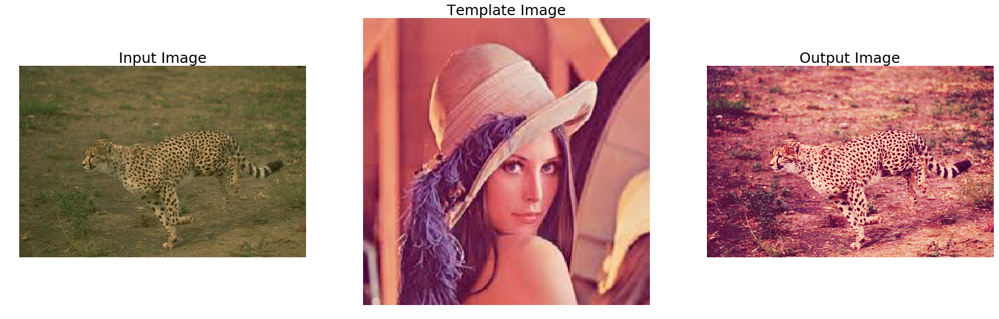

In [25]:
%matplotlib inline
from skimage.exposure import cumulative_distribution
from skimage.color import rgb2gray
import matplotlib.pylab as plt
import numpy as np

def hist_matching(c, c_t, im):
    b = np.interp(c, c_t, np.arange(256))   # find closest matches to b_t
    pix_repl = {i:b[i] for i in range(256)} # dictionary to replace the pixels
    mp = np.arange(0,256)
    for (k, v) in pix_repl.items():
        mp[k] = v
    s = im.shape
    im = np.reshape(mp[im.ravel()], im.shape)
    im = np.reshape(im, s)
    return im

def cdf(im):
    c, b = cumulative_distribution(im)
    #print(b)
    for i in range(b[0]):
        c = np.insert(c, 0, 0)
    for i in range(b[-1]+1, 256):
        c = np.append(c, 1)
    return c

im = imread('../images/cheetah.png').astype(np.uint8)
im_t = imread('../images/lena.jpg')
print(np.max(im), np.max(im_t))

im1 = np.zeros(im.shape).astype(np.uint8)
for i in range(3):
    c = cdf(im[...,i])
    c_t = cdf(im_t[...,i])
    im1[...,i] = hist_matching(c, c_t, im[...,i])

plt.figure(figsize=(30,10))
plt.subplot(131), plt.imshow(im), plt.axis('off'), plt.title('Input Image', size=25)
plt.subplot(132), plt.imshow(im_t), plt.axis('off'), plt.title('Template Image', size=25)
plt.subplot(133), plt.imshow(im1[...,:3]), plt.axis('off'), plt.title('Output Image', size=25)
plt.show()

### Linear noise smoothing

Linear (spatial) filtering is a function with a weighted sum of pixel values (in a neighborhood). It is a linear operation on an image that can be used for blurring/noise reduction. Blurring is used in pre-processing steps; for example, in the removal of small (irrelevant) details. A few popular linear filters are the box filter and the Gaussian filter. The filter is implemented with a small (for example, 3 x 3) kernel (mask), and the pixel values are recomputed by sliding the mask over the input image and applying the filter function to every possible pixel in the input image (the input image's center pixel value corresponding to the mask is replaced by the weighted sum of pixel values, with the weights from the mask). The box filter (also called the averaging filter), for example, replaces each pixel with an average of its neighborhood and achieves a smoothing effect(by removing sharp features; for example, it blurs edges, whereas spatial averaging removes noise).

The following sections illustrate how to apply linear noise smoothing on images first using the PIL ImageFilter module and then using the SciPy ndimage module's filter functions.

#### Smoothing with PIL

The following sections demonstrate how the functions from the PIL ImageFilter module can be used for linear noise smoothing; in other words, noise smoothing with linear filters.

#### Smoothing with ImageFilter.BLUR

The following shows how the PIL ImageFilter module's filter function can be used to apply a blur to denoise a noisy image. The noise level on the input image is varied to see its impact on the blur filter. The popular mandrill (baboon) image is used as the input image for this example; the image is protected by a Creative Commons license (https://creativecommons.org/licenses/by-sa/2.0/) and can be found at https://www.flickr.com/photos/uhuru1701/2249220078 and in the SIPI image database: http://sipi.usc.edu/database/database.php?volume=misc&image=10#top:

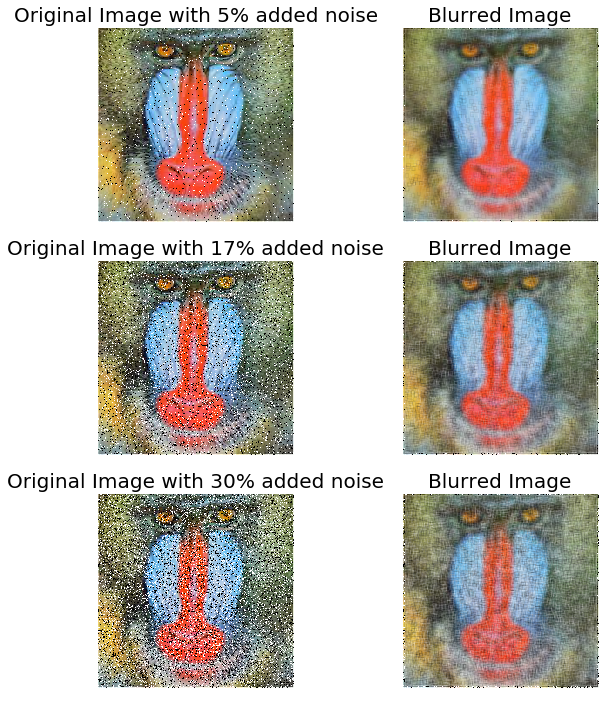

In [26]:
i = 1
pylab.figure(figsize=(10,25))
for prop_noise in np.linspace(0.05,0.3,3):
    im = Image.open('../images/mandrill.jpg')
    # choose 5000 random locations inside image
    n = int(im.width * im.height * prop_noise)
    x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height, n)
    for (x,y) in zip(x,y):
        im.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # generate salt-and-pepper noise
    im.save('../images/mandrill_spnoise_' + str(prop_noise) + '.jpg')
    pylab.subplot(6,2,i), plot_image(im, 'Original Image with ' +
    str(int(100*prop_noise)) + '% added noise')
    i += 1
    im1 = im.filter(ImageFilter.BLUR)
    pylab.subplot(6,2,i), plot_image(im1, 'Blurred Image')
    i += 1
pylab.show()

The screenshot shows the output. The smoothed image quality gets poorer as the input image gets noisier, as expected.

#### Smoothing by averaging with the box blur kernel

The following code block shows how to use the PIL ImageFilter.Kernel() function and box blur kernels (mean filters) of a size of 3 x 3 and 5 x 5 to smooth a noisy image

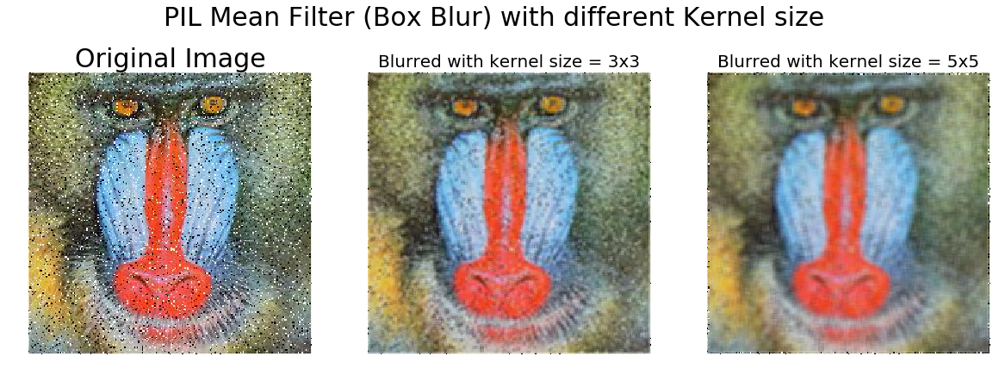

In [27]:
im = Image.open('../images/mandrill_spnoise_0.1.jpg')
pylab.figure(figsize=(20,7))
pylab.subplot(1,3,1), pylab.imshow(im), pylab.title('Original Image', size=30), pylab.axis('off')
for n in [3,5]:
    box_blur_kernel = np.reshape(np.ones(n*n),(n,n)) / (n*n)
    im1 = im.filter(ImageFilter.Kernel((n,n), box_blur_kernel.flatten()))
    pylab.subplot(1,3,(2 if n==3 else 3))
    plot_image(im1, 'Blurred with kernel size = ' + str(n) + 'x' + str(n))
pylab.suptitle('PIL Mean Filter (Box Blur) with different Kernel size',
size=30)
pylab.show()

#### Smoothing with the Gaussian blur filter

The Gaussian blur filter is also a linear filter but, unlike the simple mean filter, it takes the weighted average of the pixels inside the kernel window to smooth a pixel (the weight corresponding to a neighbor pixel decreases exponentially with the distance of the neighbor from the pixel). The following code shows how the PIL ImageFilter.GaussianBlur() can be used to smooth a noisier image with different radius parameter values for the kernel:

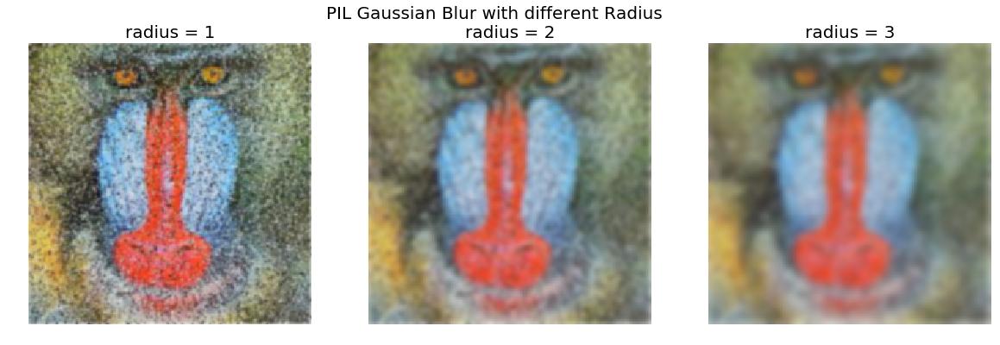

In [28]:
im = Image.open('../images/mandrill_spnoise_0.2.jpg')
pylab.figure(figsize=(20,6))
i = 1
for radius in range(1, 4):
    im1 = im.filter(ImageFilter.GaussianBlur(radius))
    pylab.subplot(1,3,i), plot_image(im1, 'radius = ' +
    str(round(radius,2)))
    i += 1
pylab.suptitle('PIL Gaussian Blur with different Radius', size=20)
pylab.show()

The screenshot shows the output. As can be seen, with a higher radius with the Gaussian filter, the image becomes smoother with the removal of more and more noise, while at the same time blurring the image more:

#### Comparing smoothing with box and Gaussian kernels using SciPy ndimage

We can apply a linear filter to smooth images using SciPy's ndimage module functions too. The following code snippet shows a demonstration of the results of applying the linear filters on the mandrill image degraded with impulse (salt-and-pepper) noise:

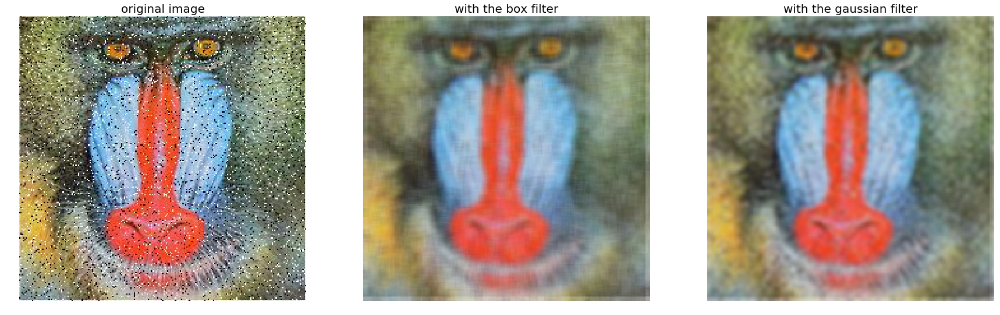

In [30]:
from scipy import misc, ndimage
import matplotlib.pylab as pylab
im = misc.imread('../images/mandrill_spnoise_0.1.jpg')
k = 7 # 7x7 kernel
im_box = ndimage.uniform_filter(im, size=(k,k,1))
s = 2 # sigma value
t = (((k - 1)/2)-0.5)/s # truncate parameter value for a kxk gaussian kernel with sigma s
im_gaussian = ndimage.gaussian_filter(im, sigma=(s,s,0), truncate=t)
fig = pylab.figure(figsize=(30,10))
pylab.subplot(131), plot_image(im, 'original image')
pylab.subplot(132), plot_image(im_box, 'with the box filter')
pylab.subplot(133), plot_image(im_gaussian, 'with the gaussian filter')
pylab.show()

The screenshot shows the output of the previous code. As can be seen, the box filter of the same kernel size blurs the output image more than the Gaussian filter of same size with σ=2.

### Nonlinear noise smoothing

Nonlinear (spatial) filters also operate on neighborhoods and are implemented by sliding a kernel (mask) over an image like a linear filter. However, the filtering operation is based conditionally on the values of the pixels in the neighborhood, and they do not explicitly use coefficients in the sum-of-products manner in general. For example, noise reduction can be effectively done with a non-linear filter whose basic function is to compute the median gray-level value in the neighborhood where the filter is located. This filter is a nonlinear filter, since the median computation is a non-linear operation. Median filters are quite popular since, for certain types of random noise (for example, impulse noise), they provide excellent noise-reduction capabilities, with considerably less blurring than linear smoothing filters of similar size. Non-linear filters are more powerful than linear filters; for example, in terms of suppression of non-Gaussian noise such as spikes and for edge/texture preserving properties. Some examples of non-linear filters are median, bilateral, non-local means, and morphological filters. The following sections demonstrate the implementation of a few non-linear filters with PIL, _**scikit-image**_, and _**scipy ndimage**_ library functions.

### Smoothing with PIL

The PIL _**ImageFilter**_ module provides a set of functions for non-linear denoising of an image. In this section, we shall demonstrate some of them with examples.

#### Using the median filter

The median filter replaces each pixel with the median of the values of its neighbor pixels. This filter is great for removing of salt-and-pepper noise, although it removes small details from the image. We need to give first rank to the neighborhood intensities and then select the middle value. Median filtering is resilient to statistical outliers, incurs less blurring, and is simple to implement. The following code block shows how the PIL _**ImageFilter**_ module's _**MedianFilter()**_ function can be used to remove salt-and-pepper noise from the noisy mandrill image, with different levels of noise added and a different size of the kernel window used for the median filter:

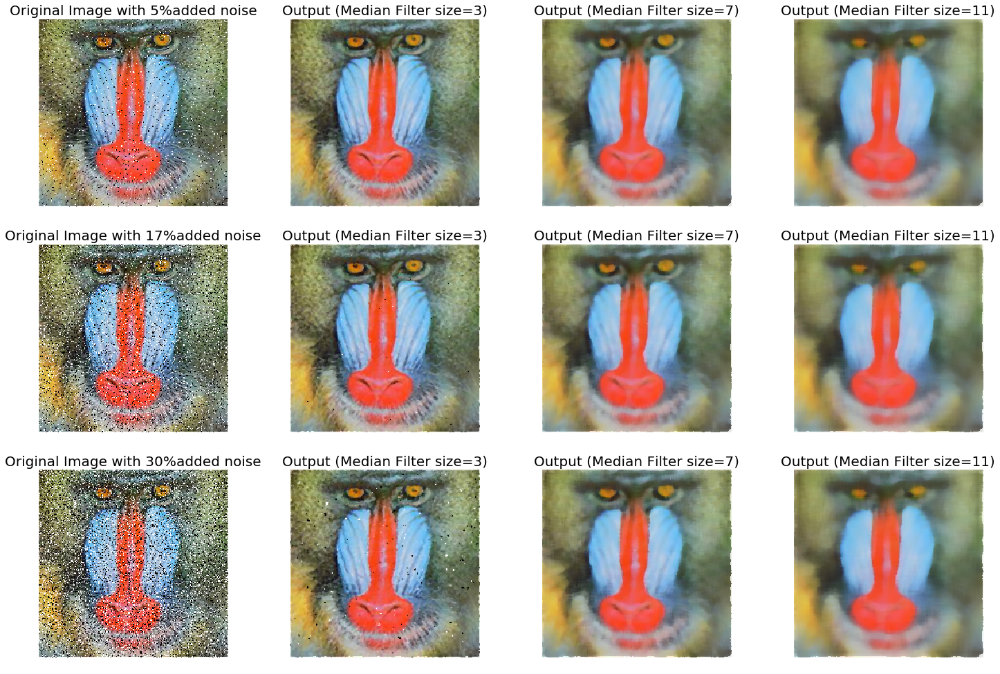

In [31]:
i = 1
pylab.figure(figsize=(25,35))
for prop_noise in np.linspace(0.05,0.3,3):
    im = Image.open('../images/mandrill.jpg')
    # choose 5000 random locations inside image
    n = int(im.width * im.height * prop_noise)
    x, y = np.random.randint(0, im.width, n), np.random.randint(0, im.height, n)
    for (x,y) in zip(x,y):
        im.putpixel((x, y), ((0,0,0) if np.random.rand() < 0.5 else (255,255,255))) # geenrate salt-and-pepper noise
    im.save('../images/mandrill_spnoise_' + str(prop_noise) + '.jpg')
    pylab.subplot(6,4,i)
    plot_image(im, 'Original Image with ' + str(int(100*prop_noise)) + '%added noise')
    i += 1
    for sz in [3,7,11]:
        im1 = im.filter(ImageFilter.MedianFilter(size=sz))
        pylab.subplot(6,4,i), plot_image(im1, 'Output (Median Filter size=' +  str(sz) + ')')
        i += 1
pylab.show()

The screenshot shows the output of the previous code, the output images after applying the median filter on the noisy images with different levels of added noise with a different kernel size. As can be seen, the results show that the non-linear median filter works much better for impulse (salt-and-pepper) noise than the linear mean and weighted mean (Gaussian) filters, although with some patchy effects and the loss of some details.

#### Using max and min filter

The following code shows how to use the MaxFilter()to remove the pepper noise followed by a MinFilter() to remove the salt noise from an image.

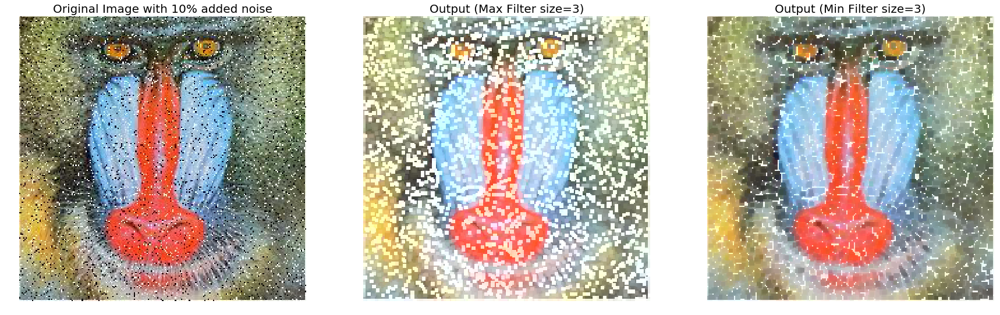

In [32]:
im = Image.open('../images/mandrill_spnoise_0.1.jpg')
pylab.figure(figsize=(30,10))
sz = 3
pylab.subplot(1,3,1)
plot_image(im, 'Original Image with 10% added noise')
im1 = im.filter(ImageFilter.MaxFilter(size=sz))
pylab.subplot(1,3,2), plot_image(im1, 'Output (Max Filter size=' + str(sz)+ ')')
im1 = im1.filter(ImageFilter.MinFilter(size=sz))
pylab.subplot(1,3,3), plot_image(im1, 'Output (Min Filter size=' + str(sz)+ ')')
pylab.show()

### Smoothing (denoising) with scikit-image

The _**scikit-image**_ library also provides a set of non-linear filters in the **restoration** module. In the following sections, we will discuss about a couple of such very useful filters, namely **bilateral** and **non-local** means filters.

#### Using the bilateral filter

The bilateral filter is an edge-preserving smoothing filter. For this filter, the center pixel is set to the weighted average of the pixel values of some of its neighbors **only the ones with roughly similar brightness as the center pixel**. In this section, we shall see how we can use scikit-image package's bilateral filter implementation to denoise an image. Let us first start by creating a noisy image from the following gray scale mountain image:

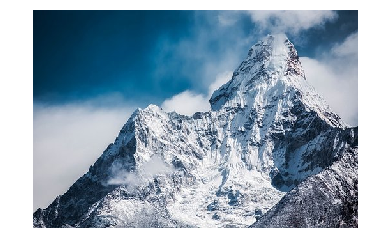

In [36]:
im = Image.open('../images/mountain.png')
pylab.imshow(im)
pylab.axis("off")
pylab.show()

The following code block demonstrates how to use the numpy random_noise()function:   

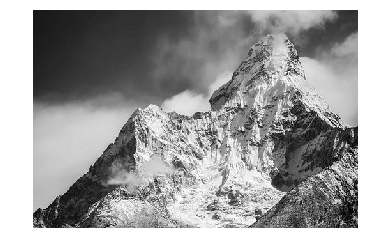

In [39]:
im = color.rgb2gray(img_as_float(io.imread('../images/mountain.png')))
pylab.axis("off")
pylab.imshow(im)
pylab.show()

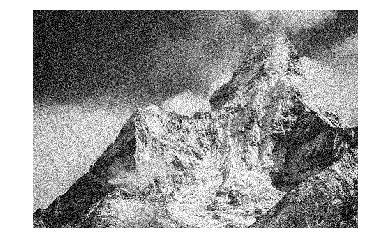

In [41]:
sigma = 0.155
noisy = random_noise(im, var=sigma**2)
pylab.imshow(noisy)
pylab.axis("off")
pylab.show()


The following code block demonstrates how to use the bilateral filter to denoise the previous noisy image, with different values for the parameters, **σcolor** and **σspatial**:


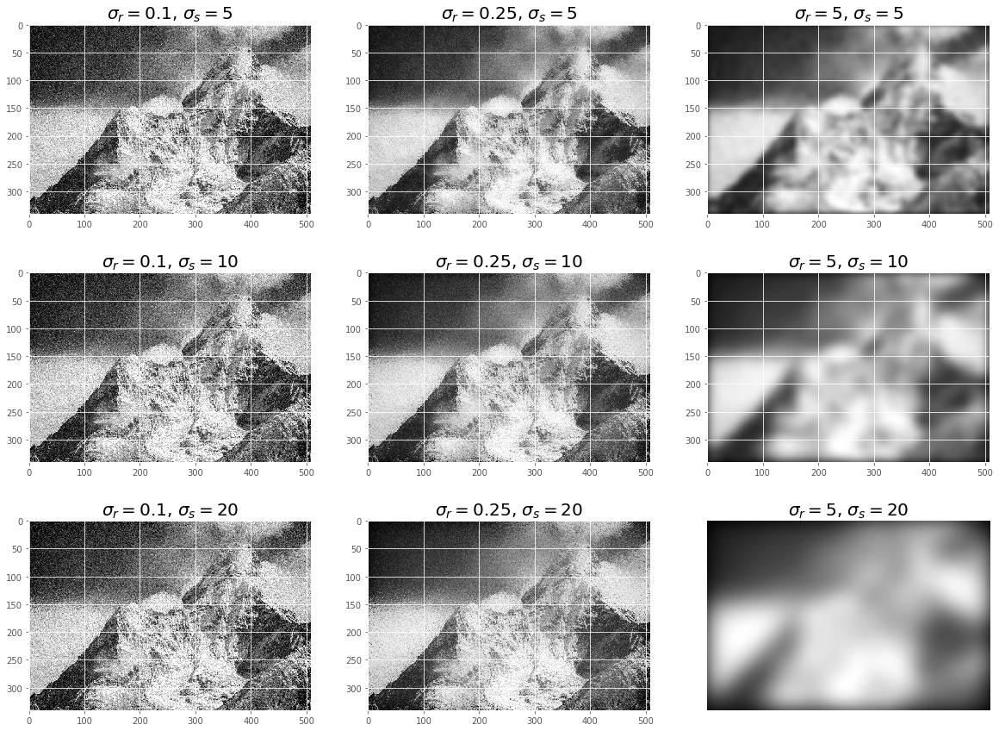

In [42]:
pylab.figure(figsize=(20,15))
i = 1
for sigma_sp in [5, 10, 20]:
    for sigma_col in [0.1, 0.25, 5]:
        pylab.subplot(3,3,i)
        pylab.imshow(denoise_bilateral(noisy, sigma_color=sigma_col,
        sigma_spatial=sigma_sp, multichannel=False))
        pylab.title(r'$\sigma_r=$' + str(sigma_col) + r', $\sigma_s=$' + str(sigma_sp), size=20)
        i += 1
pylab.axis("off")
pylab.show()

The screenshot shows the output of the previous code. As can be seen, if the standard deviation is higher, the image gets less noisy but more blurred. It takes a few minutes to execute the previous code block, as the implementation is even slower on RGB images.

#### Using non-local means

Non-local means is a non-linear denoising algorithm that **preserves textures**. In this algorithm, for any given pixel, a weighted average of values of only those nearby pixels that have similar local neighbors as the pixel of interest are used to set the value of the given pixel. In other words, small patches centered on the other pixels are compared to the patch centered on the pixel of interest. In this section, we demonstrate the algorithm by denoising a noisy parrot image using the non-local means filter. The _**h**_ parameter to the function controls the decay in patch weights as a function of the distance between patches. If _**h**_ is large, it allows more smoothing between dissimilar patches. The following code block shows how to denoise with non-local means:

estimated noise standard deviation = 0.21940489059491528
PSNR (noisy) = 13.04
PSNR (slow) = 25.93
PSNR (fast) = 25.52


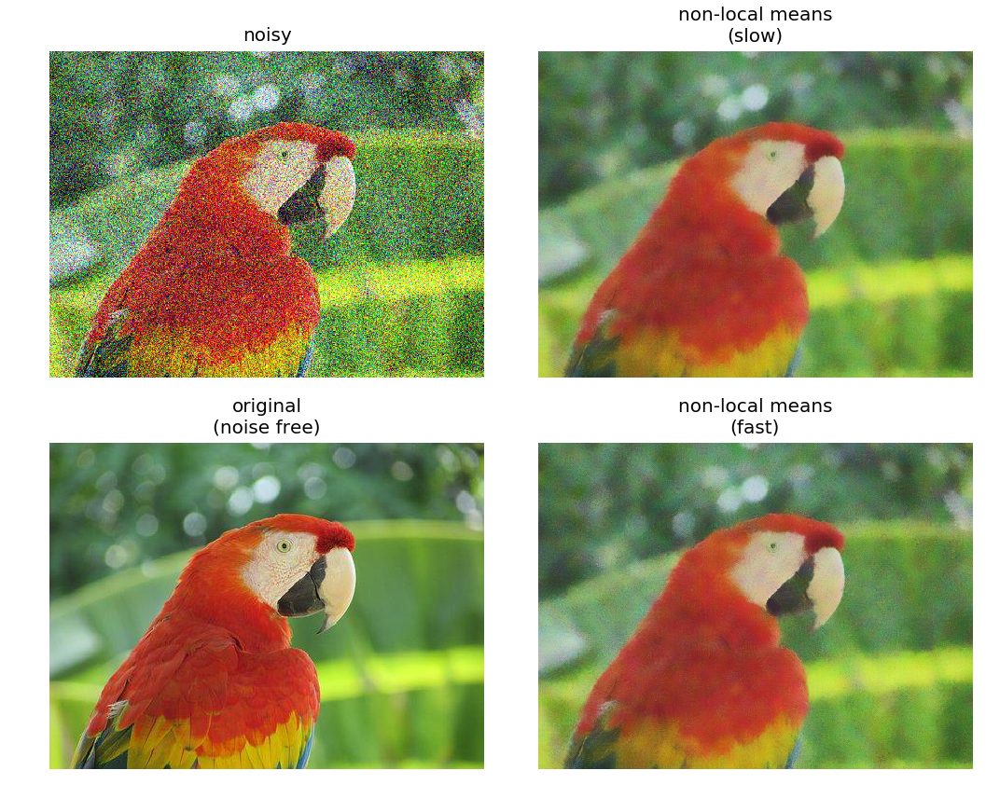

In [18]:
def plot_image_axes(image, axes, title):
    axes.imshow(image)
    axes.axis('off')
    axes.set_title(title, size=20)
    
parrot = img_as_float(imread('../images/parrot.png'))
sigma = 0.25
noisy = parrot + sigma * np.random.standard_normal(parrot.shape)
noisy = np.clip(noisy, 0, 1)
# estimate the noise standard deviation from the noisy image
sigma_est = np.mean(estimate_sigma(noisy, multichannel=True))
print("estimated noise standard deviation = {}".format(sigma_est))
# estimated noise standard deviation = 0.22048519002358943
patch_kw = dict(patch_size=5, # 5x5 patches
patch_distance=6, # 13x13 search area
multichannel=True)
# slow algorithm
denoise = denoise_nl_means(noisy, h=1.15 * sigma_est, fast_mode=False,
**patch_kw)
# fast algorithm
denoise_fast = denoise_nl_means(noisy, h=0.8 * sigma_est, fast_mode=True,
**patch_kw)
fig, axes = pylab.subplots(nrows=2, ncols=2, figsize=(15, 12), sharex=True,
sharey=True)
plot_image_axes(noisy, axes[0, 0], 'noisy')
plot_image_axes(denoise, axes[0, 1], 'non-local means\n(slow)')
plot_image_axes(parrot, axes[1, 0], 'original\n(noise free)')
plot_image_axes(denoise_fast, axes[1, 1], 'non-local means\n(fast)')
fig.tight_layout()
# PSNR metric values
psnr_noisy = compare_psnr(parrot, noisy)
psnr = compare_psnr(parrot, denoise.astype(np.float64))
psnr_fast = compare_psnr(parrot, denoise_fast.astype(np.float64))
print("PSNR (noisy) = {:0.2f}".format(psnr_noisy))
print("PSNR (slow) = {:0.2f}".format(psnr))
print("PSNR (fast) = {:0.2f}".format(psnr_fast))
# PSNR (noisy) = 13.04 # PSNR (slow) = 26.25 # PSNR (fast) = 25.84
pylab.show()

The got screenshot shows the output. As can be seen, the slow version of the algorithm achieves better PSNR than the faster version, representing a trade-off. Both of the algorithm output images have much higher PSNR than the noisy image.

### Smoothing with scipy ndimage

The scipy _**ndimage**_ module provides a function named percentile_filter(), which is a generic version of the median filter. The following code block demonstrates how to use this filter:

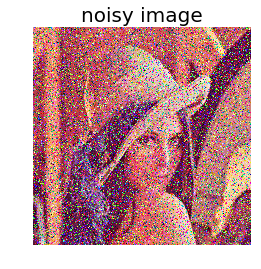

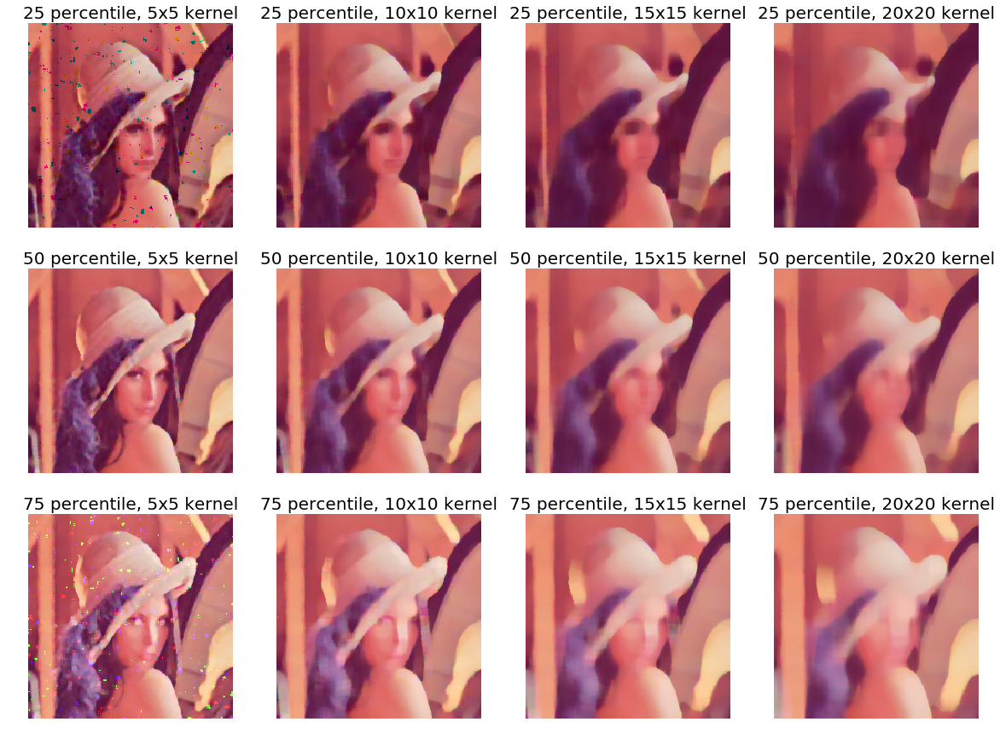

In [56]:
lena = misc.imread('../images/lena.jpg')
# add salt-and-pepper noise to the input image
noise = np.random.random(lena.shape)
lena[noise > 0.9] = 255
lena[noise < 0.1] = 0
plot_image(lena, 'noisy image')
pylab.show()
fig = pylab.figure(figsize=(20,15))
i = 1
for p in range(25, 100, 25):
    for k in range(5, 25, 5):
        pylab.subplot(3,4,i)
        filtered = ndimage.percentile_filter(lena, percentile=p, size=(k,k,1))
        plot_image(filtered, str(p) + ' percentile, ' + str(k) + 'x' + str(k) + ' kernel')
        i += 1
pylab.show()

The gotten screenshot shows the output of the previous code. As can be seen, out of all of the percentile filters, the median filter (corresponding to the 50th percentile) with a small kernel size does the best to remove salt-and-pepper noise, while at the same time losing the fewest possible details in the image.

### Summary

In this chapter, we discussed different image enhancement methods, starting from point transformations (for example, contrast stretching and thresholding), then techniques based on histogram processing (for example, histogram equalization and histogram matching), followed by image denoising techniques with linear (for example, mean and Gaussian) and non-linear (for example, median, bilateral, and non-local means) filters.By the end of this chapter, the reader should be able to write Python codes for point transformations (for example, negative, power-law transform, and contrast stretching), histogram-based image enhancements (for example, histogram equalization/matching), and image denoising (for example, mean/median filters).In the following chapter, we shall continue discussing more image enhancement techniques based on image derivatives and gradients.

### Further reading

- http://paulbourke.net/miscellaneous/equalisation/
- https://pdfs.semanticscholar.org/presentation/3fb7/fa0fca1bab83d523d882e98efa0f5769ec64.pdf
- https://www.comp.nus.edu.sg/~cs4243/doc/SciPy%20reference.pdf
https://en.wikipedia.org/wiki/Floyd%E2%80%93Steinberg_dithering
- https://en.wikipedia.org/wiki/Floyd%E2%80%93Steinberg_dithering
